In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata

from anndata import AnnData
from scarches.models.scpoli import scPoli

import umap

INFO:pytorch_lightning.utilities.seed:Global seed set to 0
/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)
 captum (see https://github.com/pytorch/captum).


## Specify working directory

In [2]:
WD = "/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93vel/atlas_building"
VERSION = 3

## Functions

In [3]:
def read_samples(project_dir, sample_sheet, annot_dir):
    adata_list=[]
    for sample in sample_sheet.sample_id:
        sample_file=f"{project_dir}/h5ad_pyraw/cp_h5ad/{sample}_pyraw.h5ad"
        adata = sc.read_h5ad(sample_file)
        adata.obs['sample_id'] = sample
        origin = sample_sheet[sample_sheet['sample_id'] == sample]['derive'].values[0]
        adata.obs['derive'] = origin
        adata.var = adata.var.drop(adata.var.columns, axis=1)
        # adata = cc_reg(adata, ccgenes_file)
        meta_file = f"{annot_dir}/{sample}_annotation.txt"
        if os.path.exists(meta_file) and os.path.getsize(meta_file)>1:
            meta_data = pd.read_csv(meta_file, sep="\t", index_col=0)
            adata.obs = pd.merge(adata.obs, meta_data, left_index=True, right_index=True)
        else:
            adata.obs['level_1'] = 'epithelial'
            adata.obs['level_2'] = 'na'

        adata_list.append(adata)
    adata_concat = anndata.concat(adata_list, join='outer', fill_value=0)
    adata_concat.obs['publication'] = ['_'.join(i.split('_')[:3]) for i in adata_concat.obs.sample_id.tolist()]

    adata_concat.obs.index.name = "cells"

    return adata_concat
    
def clear_genes(project_dir, adata):
    # clear_genes = pd.read_csv("/home/xuq44/refgenomes/hg38/hg_genes_clear_nocc.txt", header=None)[0].tolist()
    clear_genes = pd.read_csv(os.path.join(project_dir, "hg_genes_clear.txt"), header=None)[0].tolist()
    sub_clear_genes = [i for i in clear_genes if i in adata.var.index.tolist()]
    adata = adata[:, sub_clear_genes]
    
    return adata

def cc_reg(adata, ccgenes_file):
    cell_cycle_genes = [x.strip() for x in open(ccgenes_file)]
    s_genes = cell_cycle_genes[:43]
    g2m_genes = cell_cycle_genes[43:]
    cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
    sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
    sc.pp.regress_out(adata, ['S_score', 'G2M_score'])
    return adata

def pre_inti0(adata):
    adata.layers['counts']=adata.X
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    adata.raw = adata

    return adata

def run_merge(adata):
    sc.pp.neighbors(adata, n_pcs=30)
    sc.tl.umap(adata)
    return adata

def get_kwargs():
    early_stopping_kwargs = {
        "early_stopping_metric": "val_prototype_loss",
        "mode": "min",
        "threshold": 0,
        "patience": 20,
        "reduce_lr": True,
        "lr_patience": 13,
        "lr_factor": 0.1,
    }
    return early_stopping_kwargs

def train_scpoli(adata):
    early_stopping_kwargs = get_kwargs()

    scpoli_model = scPoli(
        adata=adata,
        unknown_ct_names=['na'],
        condition_keys='sample_id',
        cell_type_keys=['level_2'],
        embedding_dims=3,
        hidden_layer_sizes=[int(np.sqrt(adata.shape[0]))]
    )

    scpoli_model.train(
        n_epochs=5,
        pretraining_epochs=4,
        early_stopping_kwargs=early_stopping_kwargs,
        eta=10,
        alpha_epoch_anneal=100
    )

    return scpoli_model

def map_query(adata, model):
    early_stopping_kwargs = get_kwargs()

    scpoli_query = scPoli.load_query_data(
        adata=adata,
        reference_model=model,
        labeled_indices=[],
    )

    scpoli_query.train(
        n_epochs=5,
        pretraining_epochs=4,
        early_stopping_kwargs=early_stopping_kwargs,
        eta=10,
        alpha_epoch_anneal=100
    )

    return scpoli_query

def umap_transform(adata_ref, adata_que, cell_type_col):
    model = umap.UMAP(n_neighbors=5, random_state=42, min_dist=0.5).fit(adata_ref.X)
    adata_ref.obsm['X_umap'] = model.transform(adata_ref.X)
    adata_que.obsm['X_umap'] = model.transform(adata_que.X)
    
    adata_ref.obs['query'] = 0
    adata_que.obs['query'] = 1
    
    adata_ref.obs['cell_type_pred'] = np.nan
    adata_que.obs[cell_type_col] = adata_que.obs['cell_type_pred']
    
    adata_all = anndata.concat([adata_ref, adata_que])

    return adata_all


## Load samples

In [4]:
project_dir = os.path.join(WD, 'data')
annot_dir = os.path.join(project_dir, 'sample_annot6')
sample_sheet = pd.read_csv(os.path.join(project_dir, 'all_samples_sheets_corrected.txt'), sep='\t')
sample_sheet = sample_sheet[sample_sheet.tissue=='lung']

### Load reference data

In [5]:
# FETAL
# cell_type_col = 'new_celltype'
# reference = sc.read(os.path.join(project_dir, 'reference/Assembled10DomainsEpithelial.h5ad'))
# reference = clear_genes(project_dir, reference)
# reference.obs['level_1'] = 'epithelial'
# reference.obs['level_2'] = reference.obs[cell_type_col].copy()
# reference.obs['sample_id'] = reference.obs['donor'].copy()

In [6]:
# MATURE
cell_type_col = 'predicted_labels'
reference = sc.read(os.path.join(project_dir, 'reference/Barbry_Leroy_2020_epithelial_annot.h5ad'))
reference = clear_genes(project_dir, reference)
reference.obs['level_1'] = 'epithelial'
reference.obs['level_2'] = reference.obs[cell_type_col].copy()
reference.obs['sample_id'] = reference.obs['sample'].copy()
reference.uns['log1p'] = {'base': None}

/tmp/ipykernel_3011463/1233224719.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  reference.obs['level_1'] = 'epithelial'


In [7]:
reference.obs['derive'] = np.nan
sc.pp.highly_variable_genes(reference, n_top_genes=3000, batch_key='sample_id')
reference = reference[:,reference.var.highly_variable]

### Load organoid data

In [8]:
organoid = read_samples(project_dir, sample_sheet, annot_dir)
organoid = organoid[organoid.obs.level_1=='epithelial']
organoid = pre_inti0(organoid)
organoid.X = organoid.X.astype(np.float32)

/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/anndata/_core/merge.py:1111: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(
/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [9]:
try:
    organoid = organoid[:,reference.var.index]
except:
    a = set(reference.var.index)
    b = set(organoid.var.index)
    overlap = a.intersection(b)
    reference = reference[:,pd.Index(overlap)]
    organoid = organoid[:,pd.Index(overlap)]

## Train Q2R model

In [10]:
scpoli_model = train_scpoli(reference)

/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/scarches/models/scpoli/scpoli_model.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self.adata.obs['conditions_combined'] = adata.obs[condition_keys].apply(lambda x: '_'.join(x))


Embedding dictionary:
 	Num conditions: [35]
 	Embedding dim: [3]
Encoder Architecture:
	Input Layer in, out and cond: 2992 275 3
	Mean/Var Layer in/out: 275 10
Decoder Architecture:
	First Layer in, out and cond:  10 275 3
	Output Layer in/out:  275 2992 

Initializing dataloaders
Starting training
 |████████████████----| 80.0%  - val_loss:  645.94 - val_cvae_loss:  645.94
Initializing unlabeled prototypes with Leiden with an unknown number of  clusters.
Clustering succesful. Found 48 clusters.
 |████████████████████| 100.0%  - val_loss:  709.56 - val_cvae_loss:  652.54 - val_prototype_loss:   57.01 - val_unlabeled_loss:    0.74 - val_labeled_loss:    5.70


In [11]:
reference.obsm['X_scPoli'] = scpoli_model.get_latent(
    reference,
    mean=True,
)

/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/scarches/models/scpoli/scpoli_model.py:344: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:245.)
  c = torch.tensor(label_tensor, device=device).T


/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


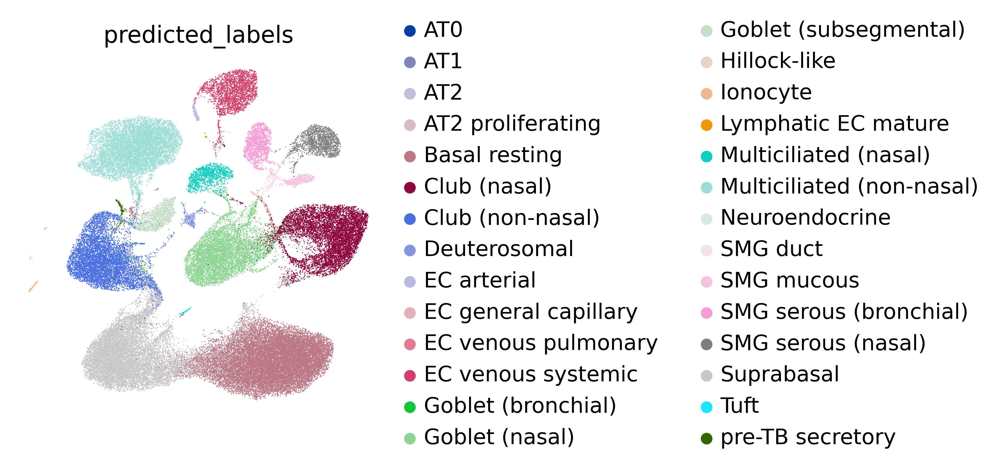

In [29]:
# visualize the latent representation of reference cells computed by scPoli
sc.pp.neighbors(reference, use_rep='X_scPoli')
sc.tl.umap(reference)
sc.pl.umap(
    reference, 
    color=cell_type_col,
    show=True,
    frameon=False,
    save=f'_scPoli_latent_v{VERSION}.png',
)

## Map organoid to reference cells

In [15]:
scpoli_query = map_query(organoid, scpoli_model)

# get latent representation of reference data
scpoli_query.model.eval()
data_latent_source = scpoli_query.get_latent(
    reference,
    mean=True,
)

# get latent representation of query data
data_latent_target = scpoli_query.get_latent(
    organoid,
    mean=True,
)

adata_latent_source = AnnData(data_latent_source)
adata_latent_source.obs = reference.obs.copy()

adata_latent_target = AnnData(data_latent_target)
adata_latent_target.obs = organoid.obs.copy()

/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/scarches/models/scpoli/scpoli_model.py:766: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['conditions_combined'] = adata.obs[condition_keys].apply(lambda x: '_'.join(x))
/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Embedding dictionary:
 	Num conditions: [70]
 	Embedding dim: [3]
Encoder Architecture:
	Input Layer in, out and cond: 2992 275 3
	Mean/Var Layer in/out: 275 10
Decoder Architecture:
	First Layer in, out and cond:  10 275 3
	Output Layer in/out:  275 2992 

The missing labels are: {'ciliated cells', 'basel cells', 'club cells', 'airway secretory cells', 'neuroendocrine cells', 'alveolar type 1 (AT1) cells', 'goblet cells', 'stem cells', 'alveolar type 2 (AT2) cells'}
Therefore integer value of those labels is set to -1
The missing labels are: {'ciliated cells', 'basel cells', 'club cells', 'airway secretory cells', 'alveolar type 1 (AT1) cells', 'goblet cells', 'stem cells'}
Therefore integer value of those labels is set to -1
The missing labels are: {'ciliated cells', 'basel cells', 'club cells', 'airway secretory cells', 'neuroendocrine cells', 'alveolar type 1 (AT1) cells', 'goblet cells', 'stem cells', 'alveolar type 2 (AT2) cells'}
Therefore integer value of those labels is set to

In [16]:
# get label annotations
results_dict = scpoli_query.classify(organoid)
adata_latent_target.obs['cell_type_pred'] = results_dict['level_2']['preds'].tolist()
adata_latent_target.obs['cell_type_uncert'] = results_dict['level_2']['uncert'].tolist()
adata_latent_target.obs['classifier_outcome'] = (
    adata_latent_target.obs['cell_type_pred'] == adata_latent_target.obs['level_2']
)

In [17]:
# the representation is chosen automatically: For .n_vars < 50, .X is used, otherwise ‘X_pca’ is used
sc.pp.neighbors(adata_latent_target, n_neighbors=15)
sc.tl.umap(adata_latent_target)

adata_latent = umap_transform(adata_latent_source, adata_latent_target, cell_type_col=cell_type_col)

/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


## Plots

/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


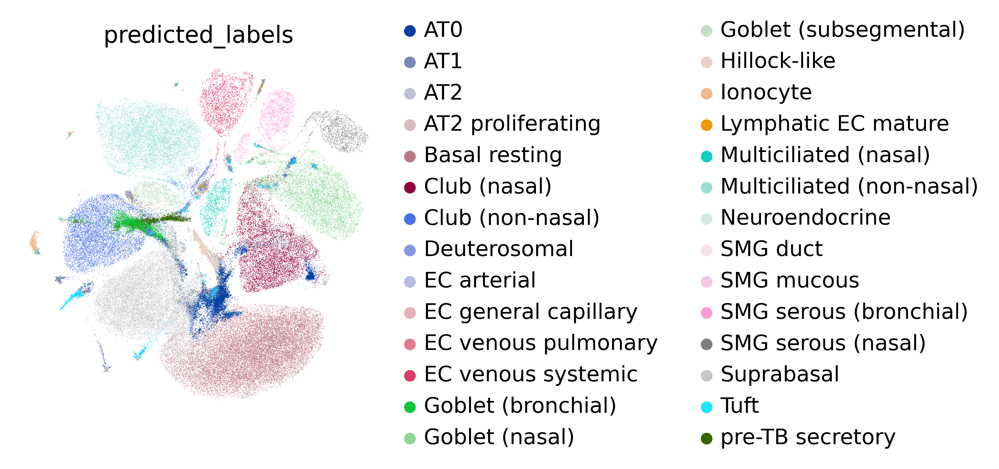

In [23]:
sc.pl.umap(
    adata_latent,
    color=cell_type_col,
    show=True,
    frameon=False,
    save=f'_new_celltype_v{VERSION}.png',
)

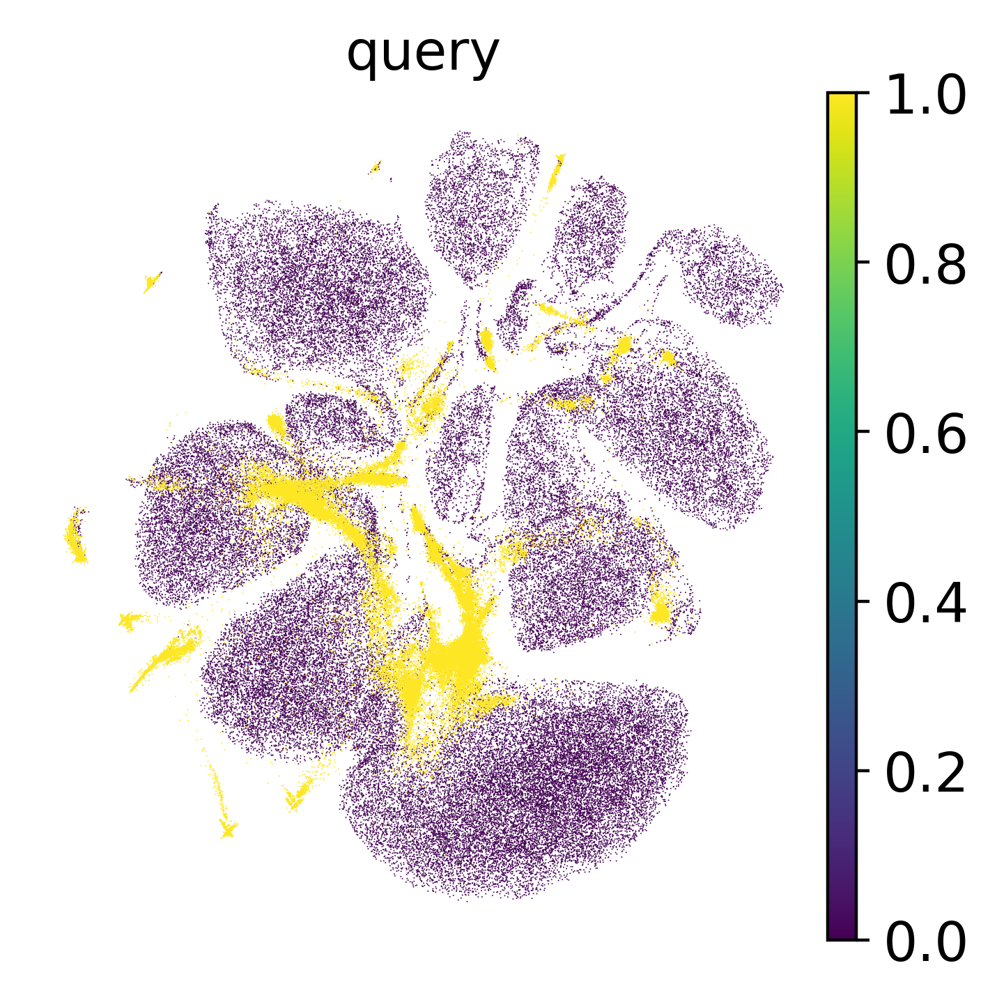

In [25]:
sc.pl.umap(
    adata_latent,
    color='query',
    show=True,
    frameon=False,
    save=f'_query_v{VERSION}.png',
)

/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


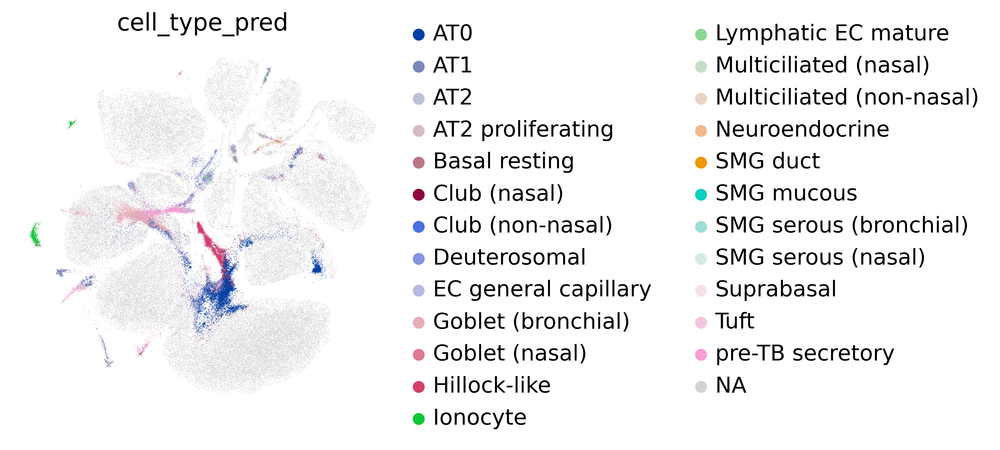

In [26]:
sc.pl.umap(
    adata_latent,
    color='cell_type_pred',
    show=True,
    frameon=False,
    save=f'_cell_type_pred_v{VERSION}.png',
)

/dss/dsshome1/06/di93vel/.conda/envs/heoa_venv/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


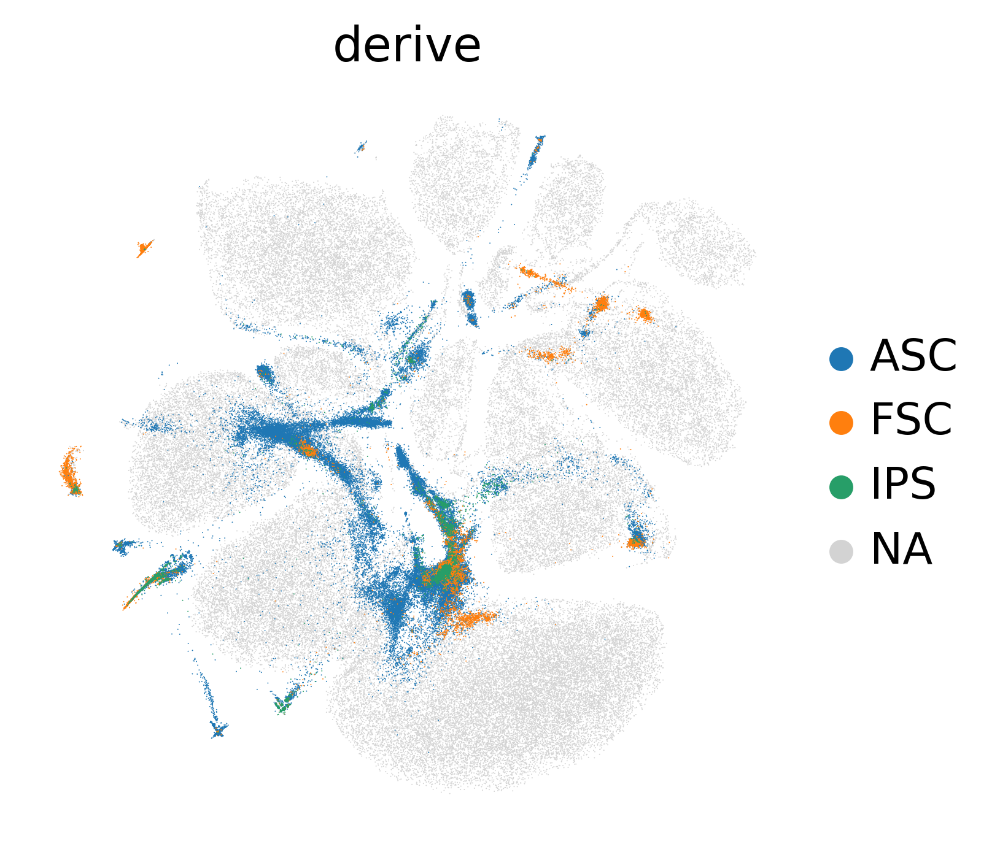

In [27]:
sc.pl.umap(
    adata_latent,
    color='derive',
    show=True,
    frameon=False,
    save=f'_derive_v{VERSION}.png',
)

## Save latent representation

In [28]:
adata_latent.write(os.path.join(WD, f"data/q2r_fetal_adata_latent_v{VERSION}.h5ad"))